<a href="https://colab.research.google.com/github/GaelAAF/fcn.berkeleyvision.org/blob/master/Absolem.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi
import os
import datetime
os.environ['CUDA_VISIBLE_DEVICES'] = "0"     #use GPU-0
%load_ext tensorboard

Thu Nov 20 02:03:12 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-80GB          Off |   00000000:00:05.0 Off |                    0 |
| N/A   41C    P0             55W /  400W |       0MiB /  81920MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [1]:
import os
import sys
import random
import warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
from itertools import chain
from skimage.io import imread, imshow, imread_collection, concatenate_images
from skimage.transform import resize
from skimage.morphology import label

# Importaciones corregidas para TensorFlow 2.x
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Input, BatchNormalization, Activation, Dense, Dropout
from tensorflow.keras.layers import Lambda, RepeatVector, Reshape
from tensorflow.keras.layers import Conv2D, Conv2DTranspose
from tensorflow.keras.layers import MaxPooling2D, GlobalMaxPool2D
from tensorflow.keras.layers import concatenate, add
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img

# Configuración inicial
warnings.filterwarnings('ignore', category=UserWarning, module='skimage')
seed = 42
random.seed = seed
np.random.seed = seed

print("Librerías importadas correctamente. Versión TF:", tf.__version__)

Librerías importadas correctamente. Versión TF: 2.19.0


In [3]:
!pip install tqdm
!pip install matplotlib
!pip install opencv-python
# !pip install tf-nightly  <-- COMENTA ESTA LÍNEA
!pip install scikit-learn
!pip install onnxruntime
!pip install -U tf2onnx

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.4/17.4 MB 65.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 8.5 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of onnx to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.8/455.8 kB 42.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 49.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.1/162.1 kB 16.9 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 5.29.5
    Uninstalling protobuf-5.29.5:
      Successfully uninstalled protobuf-5.29.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-metadata 1.17.2 requires protobuf>

In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [3]:
import os
from glob import glob

# 1. Definimos la ruta principal basada en tu captura de pantalla
#    Tu carpeta 'dataset' está dentro de 'VesselNet' en 'MyDrive'
BASE_PATH = '/content/gdrive/MyDrive/VesselNet/dataset/'

# 2. Definimos las rutas exactas para entrenamiento, validación y prueba
train_img_dir = os.path.join(BASE_PATH, 'train/origin/')
val_img_dir   = os.path.join(BASE_PATH, 'validate/origin/')
test_img_dir  = os.path.join(BASE_PATH, 'test/origin/')

# 3. Función mágica para encontrar las fotos (sin importar si son png, jpg o tif)
def encontrar_archivos(directorio):
    # Busca cualquier extensión de imagen común
    extensiones = ['*.png', '*.jpg', '*.jpeg', '*.tif', '*.bmp']
    archivos = []
    for ext in extensiones:
        # Busca y añade a la lista
        archivos.extend(glob(os.path.join(directorio, ext)))
    return sorted(archivos)

# 4. Ejecutamos la búsqueda
train_image_path_list = encontrar_archivos(train_img_dir)
val_image_path_list   = encontrar_archivos(val_img_dir)
test_image_path_list  = encontrar_archivos(test_img_dir)

# 5. Te muestro qué encontramos
print("--- REPORTE DE DATOS ---")
print(f"Buscando en: {BASE_PATH}")
print(f"Imágenes de ENTRENAMIENTO: {len(train_image_path_list)}")
print(f"Imágenes de VALIDACIÓN:    {len(val_image_path_list)}")
print(f"Imágenes de PRUEBA (Test): {len(test_image_path_list)}")

if len(train_image_path_list) > 0:
    print("\n✅ ¡Éxito! El código ya reconoció tus imágenes. Podemos continuar.")
else:
    print("\n❌ Error: No encontré imágenes. Verifica si las carpetas 'origin' tienen archivos dentro.")

--- REPORTE DE DATOS ---
Buscando en: /content/gdrive/MyDrive/VesselNet/dataset/
Imágenes de ENTRENAMIENTO: 40
Imágenes de VALIDACIÓN:    20
Imágenes de PRUEBA (Test): 0

✅ ¡Éxito! El código ya reconoció tus imágenes. Podemos continuar.


In [4]:
import cv2
import numpy as np
from tqdm import tqdm
import random
import shutil

# --- CONFIGURACIÓN ---
PATCH_SIZE = 48          # Tamaño del recorte (48x48 px)
PATCHES_PER_IMAGE = 200  # Cuántos recortes sacar por foto (ajustable)
OUTPUT_DIR = '/content/patches_generated/' # Guardamos en local (RAM) para velocidad

# Limpiamos carpeta si ya existe
if os.path.exists(OUTPUT_DIR):
    shutil.rmtree(OUTPUT_DIR)
os.makedirs(OUTPUT_DIR + "images/")
os.makedirs(OUTPUT_DIR + "masks/")

print(f"🚀 Iniciando generación de patches en: {OUTPUT_DIR}")

count = 0
errores = 0

# Recorremos tus imágenes de entrenamiento
for img_path in tqdm(train_image_path_list):

    # 1. Cargar imagen original
    img = cv2.imread(img_path)

    if img is None:
        print(f"Error leyendo imagen: {img_path}")
        continue

    # 2. Buscar la máscara correspondiente (GroundTruth)
    # Asumimos que está en la carpeta paralela 'groundtruth' y tiene el mismo nombre
    # Truco: reemplazamos 'origin' por 'groundtruth' en la ruta
    mask_path = img_path.replace('origin', 'groundtruth')

    # Si la extensión cambia (ej. jpg -> png), intenta buscarla
    if not os.path.exists(mask_path):
        base_name = os.path.splitext(os.path.basename(img_path))[0]
        possible_exts = ['.png', '.jpg', '.tif', '.gif']
        found = False
        parent_dir = os.path.dirname(os.path.dirname(img_path)) # Subir niveles
        gt_dir = os.path.join(parent_dir, 'groundtruth')

        for ext in possible_exts:
            temp_path = os.path.join(gt_dir, base_name + ext)
            if os.path.exists(temp_path):
                mask_path = temp_path
                found = True
                break
        if not found:
            # print(f"⚠️ No encontré máscara para: {os.path.basename(img_path)}")
            errores += 1
            continue

    mask = cv2.imread(mask_path, 0) # Leer en escala de grises

    # Verificar tamaños
    if img.shape[:2] != mask.shape[:2]:
        mask = cv2.resize(mask, (img.shape[1], img.shape[0]))

    # 3. Generar Patches Aleatorios
    h, w, _ = img.shape

    for _ in range(PATCHES_PER_IMAGE):
        # Coordenada aleatoria
        y = random.randint(0, h - PATCH_SIZE)
        x = random.randint(0, w - PATCH_SIZE)

        # Recortar
        patch_img = img[y:y+PATCH_SIZE, x:x+PATCH_SIZE]
        patch_mask = mask[y:y+PATCH_SIZE, x:x+PATCH_SIZE]

        # Guardar
        cv2.imwrite(f"{OUTPUT_DIR}images/patch_{count}.png", patch_img)
        cv2.imwrite(f"{OUTPUT_DIR}masks/patch_{count}.png", patch_mask)
        count += 1

print("\n--- RESULTADO ---")
print(f"✅ Se generaron {count} parches de entrenamiento.")
print(f"❌ Imágenes sin máscara encontrada: {errores}")
print("Listos para empaquetar o entrenar.")

🚀 Iniciando generación de patches en: /content/patches_generated/


100%|██████████| 40/40 [01:31<00:00,  2.29s/it]


--- RESULTADO ---
✅ Se generaron 0 parches de entrenamiento.
❌ Imágenes sin máscara encontrada: 40
Listos para empaquetar o entrenar.


In [5]:
import os

# Rutas (asegurándonos que coinciden con tu Drive)
base_train = '/content/gdrive/MyDrive/VesselNet/dataset/train/'
path_origin = os.path.join(base_train, 'origin/')
path_mask = os.path.join(base_train, 'groundtruth/')

print("🕵️ REPORTE DE NOMBRES DE ARCHIVOS 🕵️")

try:
    # Listar y ordenar archivos
    files_origin = sorted(os.listdir(path_origin))
    files_mask = sorted(os.listdir(path_mask))

    print(f"\n--- Carpeta ORIGIN (Total: {len(files_origin)}) ---")
    print("Primeros 5 archivos:", files_origin[:5])

    print(f"\n--- Carpeta GROUNDTRUTH (Total: {len(files_mask)}) ---")
    print("Primeros 5 archivos:", files_mask[:5])

except FileNotFoundError:
    print("❌ Error: Alguna ruta no existe. Verifica la carpeta 'dataset/train' en tu Drive.")

🕵️ REPORTE DE NOMBRES DE ARCHIVOS 🕵️

--- Carpeta ORIGIN (Total: 40) ---
Primeros 5 archivos: ['21_training.tif', '22_training.tif', '23_training.tif', '24_training.tif', '25_training.tif']

--- Carpeta GROUNDTRUTH (Total: 40) ---
Primeros 5 archivos: ['21_manual1.tif', '22_manual1.tif', '23_manual1.tif', '24_manual1.tif', '25_manual1.tif']


In [6]:
import cv2
import numpy as np
import os
import random
import shutil
from tqdm import tqdm

# --- CONFIGURACIÓN ---
PATCH_SIZE = 48          # Tamaño del recorte (48x48 px)
PATCHES_PER_IMAGE = 200  # 200 recortes por imagen x 40 img = 8000 patches total
OUTPUT_DIR = '/content/patches_generated/'

# Limpiamos carpeta temporal si ya existe para empezar de cero
if os.path.exists(OUTPUT_DIR):
    shutil.rmtree(OUTPUT_DIR)
os.makedirs(OUTPUT_DIR + "images/")
os.makedirs(OUTPUT_DIR + "masks/")

print(f"🚀 Iniciando generación de patches correjida...")

count = 0
errores = 0

# Recorremos tus imágenes de entrenamiento
for img_path in tqdm(train_image_path_list):

    # 1. Cargar imagen original
    img = cv2.imread(img_path)
    if img is None:
        print(f"⚠️ Error leyendo imagen: {img_path}")
        continue

    # 2. CONSTRUIR LA RUTA DE LA MÁSCARA (La corrección clave)
    # Tu archivo es: .../origin/21_training.tif
    # Queremos:      .../groundtruth/21_manual1.tif

    mask_path = img_path.replace('origin', 'groundtruth')   # Cambiar carpeta
    mask_path = mask_path.replace('_training.tif', '_manual1.tif') # Cambiar terminación

    # Paranoia: Si por alguna razón es .jpg o .png, intentamos forzar .tif si no existe
    if not os.path.exists(mask_path):
         # Plan B: Reemplazo genérico
         mask_path = img_path.replace('origin', 'groundtruth').replace('_training', '_manual1')

    # 3. Verificar si existe la máscara
    if not os.path.exists(mask_path):
        # print(f"❌ No encontré la máscara: {os.path.basename(mask_path)}")
        errores += 1
        continue

    # 4. Cargar máscara en escala de grises (0)
    mask = cv2.imread(mask_path, 0)

    # Si tamaños no coinciden exactamente, redimensionar máscara a la imagen
    if img.shape[:2] != mask.shape[:2]:
        mask = cv2.resize(mask, (img.shape[1], img.shape[0]))

    # 5. Generar Patches Aleatorios
    h, w, _ = img.shape

    for _ in range(PATCHES_PER_IMAGE):
        # Coordenada aleatoria asegurando que cabe el patch
        y = random.randint(0, h - PATCH_SIZE)
        x = random.randint(0, w - PATCH_SIZE)

        # Recortar
        patch_img = img[y:y+PATCH_SIZE, x:x+PATCH_SIZE]
        patch_mask = mask[y:y+PATCH_SIZE, x:x+PATCH_SIZE]

        # Guardar en memoria temporal de Colab
        cv2.imwrite(f"{OUTPUT_DIR}images/patch_{count}.png", patch_img)
        cv2.imwrite(f"{OUTPUT_DIR}masks/patch_{count}.png", patch_mask)
        count += 1

print("\n--- RESULTADO FINAL ---")
print(f"✅ Se generaron {count} parches exitosamente.")
if errores > 0:
    print(f"❌ Imágenes fallidas: {errores}")
else:
    print("🎉 ¡Cero errores! Todas las máscaras fueron encontradas.")

🚀 Iniciando generación de patches correjida...


100%|██████████| 40/40 [00:33<00:00,  1.18it/s]


--- RESULTADO FINAL ---
✅ Se generaron 8000 parches exitosamente.
🎉 ¡Cero errores! Todas las máscaras fueron encontradas.


In [7]:
import cv2
import numpy as np
import os
from glob import glob
from tqdm import tqdm
from sklearn.model_selection import train_test_split

# --- 1. DEFINICIÓN DE FUNCIONES DE MEJORA (CLAHE & GAMMA) ---

def clahe_equalized(imgs):
    # CLAHE ayuda a resaltar las venas del fondo blanco de la esclera
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    imgs_equalized = np.empty(imgs.shape)

    # Aplicamos CLAHE a cada canal de color
    if imgs.ndim == 4: # Si es un lote de imagenes
        for k in range(imgs.shape[0]):
            for i in range(imgs.shape[3]):
                imgs_equalized[k,:,:,i] = clahe.apply(np.array(imgs[k,:,:,i], dtype=np.uint8))
    else: # Si es una sola imagen
        for i in range(imgs.shape[2]):
            imgs_equalized[:,:,i] = clahe.apply(np.array(imgs[:,:,i], dtype=np.uint8))

    return imgs_equalized

def adjust_gamma(imgs, gamma=1.0):
    # Corrección Gamma para ajustar la iluminación
    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255 for i in np.arange(0, 256)]).astype("uint8")
    new_imgs = np.empty(imgs.shape)

    if imgs.ndim == 4:
        for k in range(imgs.shape[0]):
            for i in range(imgs.shape[3]):
                new_imgs[k,:,:,i] = cv2.LUT(np.array(imgs[k,:,:,i], dtype=np.uint8), table)
    else:
        for i in range(imgs.shape[2]):
            new_imgs[:,:,i] = cv2.LUT(np.array(imgs[:,:,i], dtype=np.uint8), table)

    return new_imgs

# --- 2. CARGADOR DE DATOS (DATA LOADER) ---

def load_data_from_disk(path_images, path_masks):
    file_list = sorted(glob(path_images + "*.png"))
    mask_list = sorted(glob(path_masks + "*.png"))

    total = len(file_list)
    # Array vacío para las imágenes (N, 48, 48, 3)
    X = np.zeros((total, 48, 48, 3), dtype=np.float32)
    # Array vacío para las máscaras (N, 48, 48, 1)
    Y = np.zeros((total, 48, 48, 1), dtype=np.float32)

    print(f"Cargando y preprocesando {total} parches...")

    for i, (img_path, mask_path) in tqdm(enumerate(zip(file_list, mask_list)), total=total):
        # Leer imagen
        img = cv2.imread(img_path) # BGR
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Pasamos a RGB

        # Leer máscara
        mask = cv2.imread(mask_path, 0) # Grayscale

        # Guardar en el array gigante
        X[i] = img
        Y[i] = mask.reshape(48, 48, 1)

    return X, Y

# --- 3. EJECUCIÓN ---

# Rutas donde guardamos los parches en el paso anterior
patches_img_dir = '/content/patches_generated/images/'
patches_mask_dir = '/content/patches_generated/masks/'

# Cargar a RAM
X_data, Y_data = load_data_from_disk(patches_img_dir, patches_mask_dir)

# Aplicar Preprocesamiento Vectorizado (Más rápido)
print("\nAplicando CLAHE y Normalización...")
X_data = clahe_equalized(X_data)
X_data = adjust_gamma(X_data, gamma=1.2)
X_data = X_data / 255.0  # Normalizar entre 0 y 1
Y_data = Y_data / 255.0  # Normalizar máscara (0 o 1)
# Binarizar la máscara (asegurar que sea blanco o negro puro)
Y_data[Y_data > 0.5] = 1
Y_data[Y_data <= 0.5] = 0

# Dividir en Train y Validación (90% entrena, 10% valida)
X_train, X_val, Y_train, Y_val = train_test_split(X_data, Y_data, test_size=0.1, random_state=42)

print("\n--- DATOS LISTOS PARA ENTRENAR ---")
print(f"X_train shape: {X_train.shape}")
print(f"Y_train shape: {Y_train.shape}")
print(f"X_val shape:   {X_val.shape}")

Cargando y preprocesando 8000 parches...


100%|██████████| 8000/8000 [00:01<00:00, 5179.98it/s]



Aplicando CLAHE y Normalización...

--- DATOS LISTOS PARA ENTRENAR ---
X_train shape: (7200, 48, 48, 3)
Y_train shape: (7200, 48, 48, 1)
X_val shape:   (800, 48, 48, 3)


In [8]:
def get_unet(input_img_shape, n_filters=16, dropout=0.1, batchnorm=True):
    # Entrada
    inputs = Input(input_img_shape)

    # --- ENCODER (Bajada - Contracción) ---
    # c1: Primer nivel de características
    c1 = Conv2D(n_filters * 1, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
    if batchnorm: c1 = BatchNormalization()(c1)
    c1 = Dropout(dropout)(c1)
    c1 = Conv2D(n_filters * 1, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
    if batchnorm: c1 = BatchNormalization()(c1)
    p1 = MaxPooling2D((2, 2))(c1)

    # c2: Segundo nivel
    c2 = Conv2D(n_filters * 2, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
    if batchnorm: c2 = BatchNormalization()(c2)
    c2 = Dropout(dropout)(c2)
    c2 = Conv2D(n_filters * 2, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
    if batchnorm: c2 = BatchNormalization()(c2)
    p2 = MaxPooling2D((2, 2))(c2)

    # c3: Tercer nivel
    c3 = Conv2D(n_filters * 4, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
    if batchnorm: c3 = BatchNormalization()(c3)
    c3 = Dropout(dropout)(c3)
    c3 = Conv2D(n_filters * 4, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
    if batchnorm: c3 = BatchNormalization()(c3)
    p3 = MaxPooling2D((2, 2))(c3)

    # --- BOTTLENECK (Base de la U) ---
    c4 = Conv2D(n_filters * 8, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
    if batchnorm: c4 = BatchNormalization()(c4)
    c4 = Dropout(dropout)(c4)
    c4 = Conv2D(n_filters * 8, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
    if batchnorm: c4 = BatchNormalization()(c4)

    # --- DECODER (Subida - Expansión) ---
    # u5: Recuperamos resolución y unimos con c3 (Skip Connection)
    u5 = Conv2DTranspose(n_filters * 4, (3, 3), strides=(2, 2), padding='same')(c4)
    u5 = concatenate([u5, c3])
    c5 = Conv2D(n_filters * 4, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u5)
    if batchnorm: c5 = BatchNormalization()(c5)
    c5 = Dropout(dropout)(c5)
    c5 = Conv2D(n_filters * 4, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)
    if batchnorm: c5 = BatchNormalization()(c5)

    # u6: Unimos con c2
    u6 = Conv2DTranspose(n_filters * 2, (3, 3), strides=(2, 2), padding='same')(c5)
    u6 = concatenate([u6, c2])
    c6 = Conv2D(n_filters * 2, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
    if batchnorm: c6 = BatchNormalization()(c6)
    c6 = Dropout(dropout)(c6)
    c6 = Conv2D(n_filters * 2, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)
    if batchnorm: c6 = BatchNormalization()(c6)

    # u7: Unimos con c1
    u7 = Conv2DTranspose(n_filters * 1, (3, 3), strides=(2, 2), padding='same')(c6)
    u7 = concatenate([u7, c1])
    c7 = Conv2D(n_filters * 1, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
    if batchnorm: c7 = BatchNormalization()(c7)
    c7 = Dropout(dropout)(c7)
    c7 = Conv2D(n_filters * 1, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)
    if batchnorm: c7 = BatchNormalization()(c7)

    # Salida: 1 solo canal (blanco o negro) con activación Sigmoide (0 a 1)
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c7)

    model = Model(inputs=[inputs], outputs=[outputs])
    return model

# Instanciar el modelo
input_shape = (48, 48, 3) # Tus parches son 48x48 RGB
model = get_unet(input_shape, n_filters=16, dropout=0.1, batchnorm=True)

# Compilar (Definir métricas)
model.compile(optimizer=Adam(learning_rate=0.001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 48, 48, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 48, 48,    │        448 │ input_layer[0][0] │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 48, 48,    │         64 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 48, 48,    │          0 │ batch_normalizat… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 48, 48,    │      2,320 │ dropout[0][0]     │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 48, 48,    │         64 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 24, 24,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 24, 24,    │      4,640 │ max_pooling2d[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 24, 24,    │        128 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 24, 24,    │          0 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 24, 24,    │      9,248 │ dropout_1[0][0]   │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 24, 24,    │        128 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 12, 12,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 12, 12,    │     18,496 │ max_pooling2d_1[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 12, 12,    │        256 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 12, 12,    │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 12, 12,    │     36,928 │ dropout_2[0][0] 

 Total params: 538,609 (2.05 MB)

 Trainable params: 537,201 (2.05 MB)

 Non-trainable params: 1,408 (5.50 KB)

In [9]:
# Definimos dónde guardar el cerebro entrenado (en tu Drive para que esté seguro)
model_save_path = '/content/gdrive/MyDrive/VesselNet/unet_esclera_best.h5'

# --- CALLBACKS (Los guardianes del entrenamiento) ---
callbacks = [
    # 1. Guardar solo si mejora el error de validación (val_loss)
    ModelCheckpoint(model_save_path, verbose=1, save_best_only=True, monitor='val_loss'),

    # 2. Si no mejora en 10 épocas, parar (evita sobreajuste)
    EarlyStopping(patience=10, monitor='val_loss', verbose=1),

    # 3. Si se estanca 5 épocas, reducir el learning rate (aprender más fino)
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1, monitor='val_loss')
]

# --- ENTRENAMIENTO ---
print("🔥 Iniciando entrenamiento en GPU A100... Esto debería ser rápido.")

history = model.fit(
    X_train, Y_train,
    batch_size=32,      # Procesa 32 parches de golpe
    epochs=50,          # Intentará dar 50 vueltas completas a los datos
    verbose=1,
    validation_data=(X_val, Y_val), # Usamos tus datos de validación para examinarse
    callbacks=callbacks # Activamos los guardianes
)

print("\n✅ Entrenamiento finalizado.")
print(f"El mejor modelo se guardó en: {model_save_path}")

🔥 Iniciando entrenamiento en GPU A100... Esto debería ser rápido.
Epoch 1/50
222/225 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8320 - loss: 0.4800
Epoch 1: val_loss improved from inf to 0.21752, saving model to /content/gdrive/MyDrive/VesselNet/unet_esclera_best.h5


225/225 ━━━━━━━━━━━━━━━━━━━━ 31s 17ms/step - accuracy: 0.8334 - loss: 0.4775 - val_accuracy: 0.9227 - val_loss: 0.2175 - learning_rate: 0.0010
Epoch 2/50
218/225 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9514 - loss: 0.1698
Epoch 2: val_loss did not improve from 0.21752
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.9514 - loss: 0.1694 - val_accuracy: 0.8391 - val_loss: 1.1818 - learning_rate: 0.0010
Epoch 3/50
225/225 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9529 - loss: 0.1362
Epoch 3: val_loss improved from 0.21752 to 0.11945, saving model to /content/gdrive/MyDrive/VesselNet/unet_esclera_best.h5


225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.9529 - loss: 0.1362 - val_accuracy: 0.9556 - val_loss: 0.1195 - learning_rate: 0.0010
Epoch 4/50
221/225 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9566 - loss: 0.1175
Epoch 4: val_loss improved from 0.11945 to 0.11425, saving model to /content/gdrive/MyDrive/VesselNet/unet_esclera_best.h5


225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.9566 - loss: 0.1175 - val_accuracy: 0.9570 - val_loss: 0.1142 - learning_rate: 0.0010
Epoch 5/50
218/225 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9571 - loss: 0.1146
Epoch 5: val_loss improved from 0.11425 to 0.11186, saving model to /content/gdrive/MyDrive/VesselNet/unet_esclera_best.h5


225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.9571 - loss: 0.1146 - val_accuracy: 0.9577 - val_loss: 0.1119 - learning_rate: 0.0010
Epoch 6/50
220/225 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9588 - loss: 0.1089
Epoch 6: val_loss improved from 0.11186 to 0.11078, saving model to /content/gdrive/MyDrive/VesselNet/unet_esclera_best.h5


225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.9588 - loss: 0.1089 - val_accuracy: 0.9581 - val_loss: 0.1108 - learning_rate: 0.0010
Epoch 7/50
219/225 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9581 - loss: 0.1101
Epoch 7: val_loss improved from 0.11078 to 0.10735, saving model to /content/gdrive/MyDrive/VesselNet/unet_esclera_best.h5


225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.9581 - loss: 0.1100 - val_accuracy: 0.9587 - val_loss: 0.1074 - learning_rate: 0.0010
Epoch 8/50
218/225 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9600 - loss: 0.1042
Epoch 8: val_loss improved from 0.10735 to 0.10568, saving model to /content/gdrive/MyDrive/VesselNet/unet_esclera_best.h5


225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.9600 - loss: 0.1042 - val_accuracy: 0.9587 - val_loss: 0.1057 - learning_rate: 0.0010
Epoch 9/50
218/225 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9606 - loss: 0.1020
Epoch 9: val_loss improved from 0.10568 to 0.10432, saving model to /content/gdrive/MyDrive/VesselNet/unet_esclera_best.h5


225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.9606 - loss: 0.1021 - val_accuracy: 0.9593 - val_loss: 0.1043 - learning_rate: 0.0010
Epoch 10/50
222/225 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9612 - loss: 0.0998
Epoch 10: val_loss improved from 0.10432 to 0.10346, saving model to /content/gdrive/MyDrive/VesselNet/unet_esclera_best.h5


225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.9612 - loss: 0.0998 - val_accuracy: 0.9594 - val_loss: 0.1035 - learning_rate: 0.0010
Epoch 11/50
220/225 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9617 - loss: 0.0980
Epoch 11: val_loss did not improve from 0.10346
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.9617 - loss: 0.0980 - val_accuracy: 0.9601 - val_loss: 0.1043 - learning_rate: 0.0010
Epoch 12/50
220/225 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9620 - loss: 0.0972
Epoch 12: val_loss improved from 0.10346 to 0.10186, saving model to /content/gdrive/MyDrive/VesselNet/unet_esclera_best.h5


225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.9620 - loss: 0.0972 - val_accuracy: 0.9602 - val_loss: 0.1019 - learning_rate: 0.0010
Epoch 13/50
223/225 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9628 - loss: 0.0944
Epoch 13: val_loss did not improve from 0.10186
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.9628 - loss: 0.0944 - val_accuracy: 0.9587 - val_loss: 0.1054 - learning_rate: 0.0010
Epoch 14/50
223/225 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9629 - loss: 0.0939
Epoch 14: val_loss did not improve from 0.10186
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.9629 - loss: 0.0939 - val_accuracy: 0.9602 - val_loss: 0.1032 - learning_rate: 0.0010
Epoch 15/50
218/225 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9638 - loss: 0.0914
Epoch 15: val_loss did not improve from 0.10186
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.9637 - loss: 0.0915 - val_accuracy: 0.9588 - val_loss: 0.1042 - learning_rate: 0.0010
Epoch 16/50
219/225 ━━━━━━━━━━━

225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.9657 - loss: 0.0851 - val_accuracy: 0.9611 - val_loss: 0.0998 - learning_rate: 1.0000e-04
Epoch 19/50
224/225 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9659 - loss: 0.0841
Epoch 19: val_loss did not improve from 0.09976
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.9659 - loss: 0.0841 - val_accuracy: 0.9611 - val_loss: 0.1004 - learning_rate: 1.0000e-04
Epoch 20/50
221/225 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9655 - loss: 0.0845
Epoch 20: val_loss did not improve from 0.09976
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.9656 - loss: 0.0845 - val_accuracy: 0.9610 - val_loss: 0.1007 - learning_rate: 1.0000e-04
Epoch 21/50
220/225 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9664 - loss: 0.0827
Epoch 21: val_loss did not improve from 0.09976
225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.9664 - loss: 0.0827 - val_accuracy: 0.9610 - val_loss: 0.1007 - learning_rate: 1.0000e-04
Epoch 22/50
221

Cargando el mejor modelo guardado...



--- COMPARATIVA: Original vs Realidad (Ground Truth) vs IA (Predicción) ---


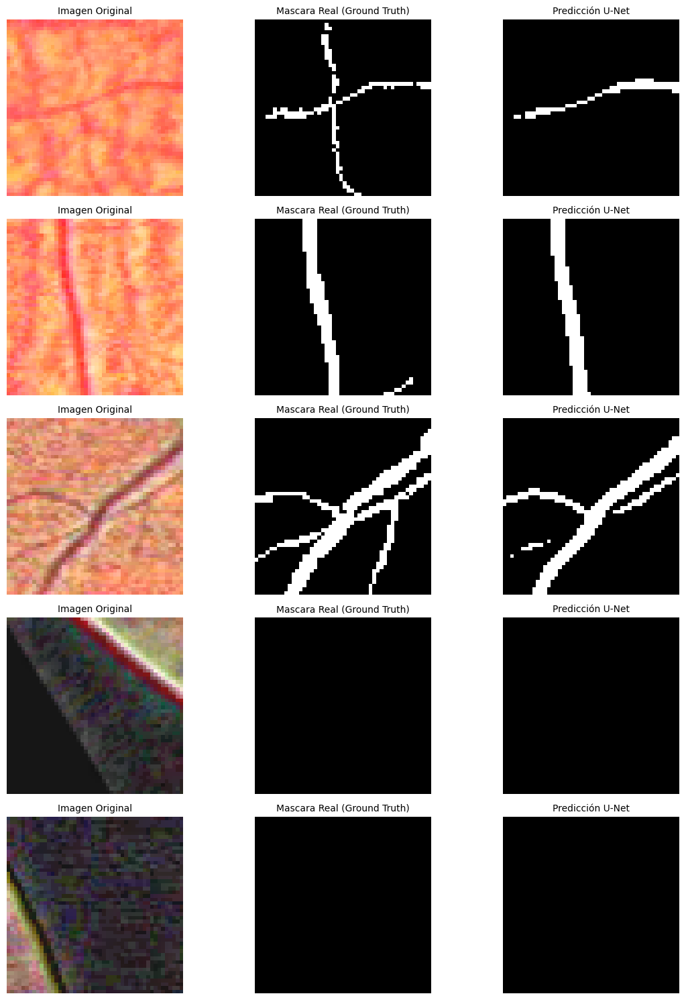

In [10]:
import matplotlib.pyplot as plt

# 1. Cargar el mejor modelo guardado (por seguridad)
print("Cargando el mejor modelo guardado...")
model = load_model('/content/gdrive/MyDrive/VesselNet/unet_esclera_best.h5')

# 2. Hacer predicciones con datos de validación (imágenes que el modelo NO usó para entrenar)
# Tomamos 5 muestras al azar
num_samples = 5
indices = np.random.randint(0, len(X_val), num_samples)

sample_images = X_val[indices]
sample_masks  = Y_val[indices]

# La IA predice:
predictions = model.predict(sample_images, verbose=0)

# Binarizamos la predicción (si la neurona duda > 0.5, es vena)
predictions_bin = (predictions > 0.5).astype(np.float32)

# 3. Visualizar
print("\n--- COMPARATIVA: Original vs Realidad (Ground Truth) vs IA (Predicción) ---")

plt.figure(figsize=(12, num_samples * 3))

for i in range(num_samples):
    # Imagen Original
    plt.subplot(num_samples, 3, i*3 + 1)
    plt.imshow(sample_images[i])
    plt.title("Imagen Original", fontsize=10)
    plt.axis('off')

    # Máscara Real (Lo que debería ser)
    plt.subplot(num_samples, 3, i*3 + 2)
    plt.imshow(sample_masks[i].reshape(48, 48), cmap='gray')
    plt.title("Mascara Real (Ground Truth)", fontsize=10)
    plt.axis('off')

    # Predicción de tu IA
    plt.subplot(num_samples, 3, i*3 + 3)
    plt.imshow(predictions_bin[i].reshape(48, 48), cmap='gray')
    plt.title("Predicción U-Net", fontsize=10)
    plt.axis('off')

plt.tight_layout()
plt.show()

Generando predicciones para 15 parches...

--- GALERÍA DE RESULTADOS: Original vs. Realidad vs. IA ---


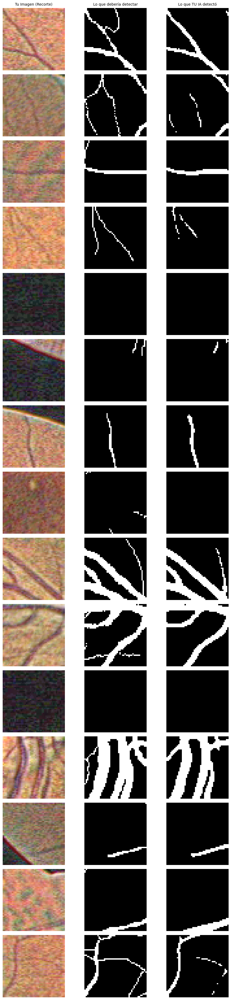

In [14]:
import matplotlib.pyplot as plt
import numpy as np
import random  # <--- Usaremos la librería estándar de Python, que es segura

# --- CONFIGURACIÓN ---
num_samples = 15

# En lugar de usar numpy para el azar, usamos Python nativo
# Esto evitará el error "int object is not callable"
indices = random.sample(range(len(X_val)), num_samples)

sample_images = X_val[indices]
sample_masks  = Y_val[indices]

# Predicción
print(f"Generando predicciones para {num_samples} parches...")
predictions = model.predict(sample_images, verbose=0)
predictions_bin = (predictions > 0.5).astype(np.float32)

# --- VISUALIZACIÓN ---
print("\n--- GALERÍA DE RESULTADOS: Original vs. Realidad vs. IA ---")
plt.figure(figsize=(10, num_samples * 2.5))

for i in range(num_samples):
    # Columna 1: Imagen Original
    plt.subplot(num_samples, 3, i*3 + 1)
    plt.imshow(sample_images[i])
    if i == 0: plt.title("Tu Imagen (Recorte)", fontsize=10)
    plt.axis('off')

    # Columna 2: Máscara Real (Ground Truth)
    plt.subplot(num_samples, 3, i*3 + 2)
    plt.imshow(sample_masks[i].reshape(48, 48), cmap='gray')
    if i == 0: plt.title("Lo que debería detectar", fontsize=10)
    plt.axis('off')

    # Columna 3: Predicción
    plt.subplot(num_samples, 3, i*3 + 3)
    plt.imshow(predictions_bin[i].reshape(48, 48), cmap='gray')
    if i == 0: plt.title("Lo que TU IA detectó", fontsize=10)
    plt.axis('off')

plt.tight_layout()
plt.show()

Reconstruyendo imagen: /content/gdrive/MyDrive/VesselNet/dataset/validate/origin/05_test.tif
Procesando 156 parches para reconstruir la imagen...


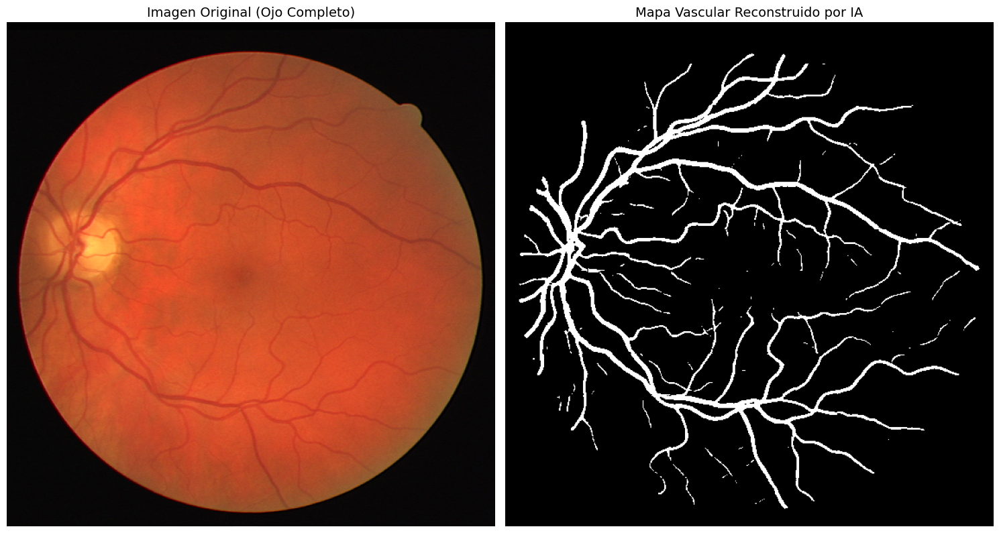

In [15]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math

# --- 1. FUNCIONES DE AYUDA (Preprocesamiento igual al entrenamiento) ---
def preprocess_single_patch(patch):
    # Aplicar CLAHE
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    # Separar canales, aplicar y unir
    img_clahe = np.zeros_like(patch)
    for i in range(3):
        img_clahe[:,:,i] = clahe.apply(patch[:,:,i])

    # Gamma
    invGamma = 1.0 / 1.2
    table = np.array([((i / 255.0) ** invGamma) * 255 for i in np.arange(0, 256)]).astype("uint8")
    img_gamma = cv2.LUT(img_clahe, table)

    # Normalizar
    return img_gamma / 255.0

def reconstruct_vessels(image_path, model, patch_size=48):
    # A. Cargar imagen original
    img_original = cv2.imread(image_path)
    if img_original is None: return None, None
    img_rgb = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

    h, w, _ = img_rgb.shape

    # B. Calcular Padding (Relleno)
    # Si la imagen no es múltiplo de 48, añadimos borde negro para que no falte nada
    pad_h = (patch_size - h % patch_size) % patch_size
    pad_w = (patch_size - w % patch_size) % patch_size

    img_padded = cv2.copyMakeBorder(img_rgb, 0, pad_h, 0, pad_w, cv2.BORDER_CONSTANT, value=0)

    h_pad, w_pad, _ = img_padded.shape

    # C. Escaneo y Predicción
    full_mask = np.zeros((h_pad, w_pad), dtype=np.float32)

    patches_list = []
    coords_list = []

    # Recorremos la imagen paso a paso
    for y in range(0, h_pad, patch_size):
        for x in range(0, w_pad, patch_size):
            patch = img_padded[y:y+patch_size, x:x+patch_size]

            # Preprocesar igual que en el entrenamiento!
            patch_processed = preprocess_single_patch(patch)

            patches_list.append(patch_processed)
            coords_list.append((y, x))

    # Convertir a array y predecir todo el lote de golpe (Batch Prediction)
    patches_array = np.array(patches_list)
    print(f"Procesando {len(patches_array)} parches para reconstruir la imagen...")

    predictions = model.predict(patches_array, verbose=0)

    # D. Reconstrucción (Pegado)
    for i, (py, px) in enumerate(coords_list):
        # Tomamos la predicción (48x48)
        pred_patch = predictions[i].reshape(patch_size, patch_size)
        # La pegamos en el lienzo gigante
        full_mask[py:py+patch_size, px:px+patch_size] = pred_patch

    # E. Recortar el padding sobrante para volver al tamaño original
    full_mask = full_mask[:h, :w]

    # Binarizar final
    full_mask = (full_mask > 0.5).astype(np.uint8)

    return img_rgb, full_mask

# --- 2. EJECUCIÓN ---

# Elegimos una imagen de validación al azar
import random
test_img_path = random.choice(val_image_path_list)

print(f"Reconstruyendo imagen: {test_img_path}")

# Llamamos a la función mágica
original, vessels = reconstruct_vessels(test_img_path, model)

# --- 3. VISUALIZACIÓN ---
if original is not None:
    plt.figure(figsize=(15, 8))

    plt.subplot(1, 2, 1)
    plt.imshow(original)
    plt.title("Imagen Original (Ojo Completo)", fontsize=14)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(vessels, cmap='gray')
    plt.title("Mapa Vascular Reconstruido por IA", fontsize=14)
    plt.axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Error al cargar la imagen.")

Generando 2 reconstrucciones completas nuevas...

Procesando imagen 1: /content/gdrive/MyDrive/VesselNet/dataset/validate/origin/18_test.tif
Procesando 156 parches para reconstruir la imagen...
Procesando imagen 2: /content/gdrive/MyDrive/VesselNet/dataset/validate/origin/07_test.tif
Procesando 156 parches para reconstruir la imagen...


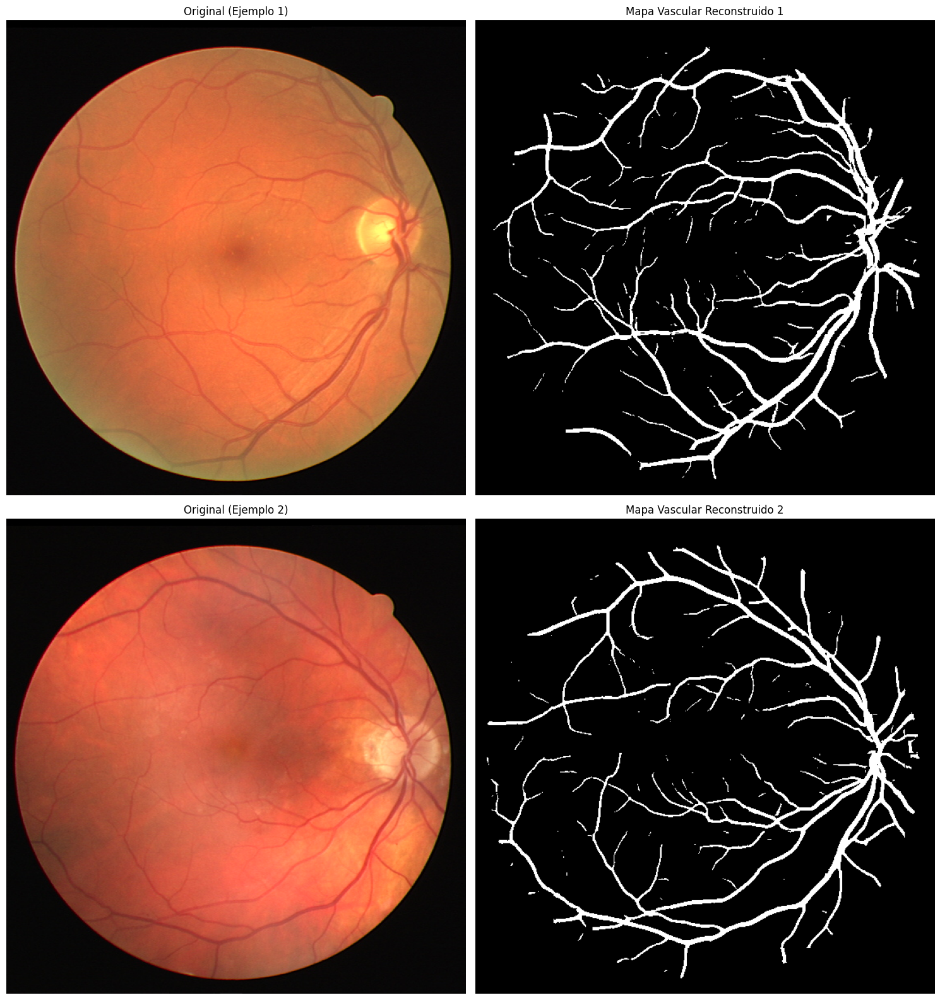

In [17]:
import random
import matplotlib.pyplot as plt

# Cantidad de ejemplos extra que quieres ver
num_new_examples = 2

# Seleccionamos imágenes al azar de tu lista de validación
# Usamos random.sample para asegurar que sean distintas entre sí
selected_indices = random.sample(range(len(val_image_path_list)), num_new_examples)

print(f"Generando {num_new_examples} reconstrucciones completas nuevas...\n")

plt.figure(figsize=(15, 8 * num_new_examples))

for i, idx in enumerate(selected_indices):
    path = val_image_path_list[idx]
    print(f"Procesando imagen {i+1}: {path}")

    # Reutilizamos la función que definimos antes
    original, vessels = reconstruct_vessels(path, model)

    if original is not None:
        # Visualización
        # Fila i, Columna 1: Original
        plt.subplot(num_new_examples, 2, i*2 + 1)
        plt.imshow(original)
        plt.title(f"Original (Ejemplo {i+1})", fontsize=12)
        plt.axis('off')

        # Fila i, Columna 2: Predicción
        plt.subplot(num_new_examples, 2, i*2 + 2)
        plt.imshow(vessels, cmap='gray')
        plt.title(f"Mapa Vascular Reconstruido {i+1}", fontsize=12)
        plt.axis('off')

plt.tight_layout()
plt.show()

In [19]:
import os
import shutil

# Ruta donde queremos guardar el nuevo dataset en tu Drive
# Nota: Cámbiala si prefieres otro nombre
DESTINO_DRIVE = '/content/gdrive/MyDrive/VesselNet/dataset_esclera/'

# 1. Descargamos un repositorio público que tiene datos de esclera (MASD/SSBC mirror)
# Este repo es ligero y sirve perfecto para prototipar "estilo Naranja Mecánica"
print("⬇️ Descargando dataset de Esclera...")
!git clone https://github.com/Abdelrahman-Gaj/Sclera-Segmentation.git temp_sclera_repo

# 2. Organizarlo en TU estructura (origin / groundtruth)
# Este repo suele venir desordenado, así que lo ordenaremos como le gusta a tu código
if not os.path.exists(DESTINO_DRIVE):
    os.makedirs(DESTINO_DRIVE + "train/origin/", exist_ok=True)
    os.makedirs(DESTINO_DRIVE + "train/groundtruth/", exist_ok=True)
    os.makedirs(DESTINO_DRIVE + "test/origin/", exist_ok=True)
    os.makedirs(DESTINO_DRIVE + "test/groundtruth/", exist_ok=True)

print("📂 Organizando archivos en tu Drive...")

# Buscamos las imágenes en la carpeta descargada
source_dir = '/content/temp_sclera_repo/data/'
# (Nota: Si la estructura interna del repo cambia, ajustaremos esta ruta)

# --- Función auxiliar para mover y renombrar ---
import glob

# Buscamos archivos png o jpg en el repo descargado
imagenes_encontradas = sorted(glob.glob("/content/temp_sclera_repo/**/*.png", recursive=True) +
                              glob.glob("/content/temp_sclera_repo/**/*.jpg", recursive=True))

count = 0
for img_path in imagenes_encontradas:
    filename = os.path.basename(img_path)

    # Filtramos: En estos datasets, a veces la máscara se llama "mask" o "seg"
    if "mask" in filename.lower() or "seg" in filename.lower() or "gt" in filename.lower():
        # Es una máscara -> Va a groundtruth
        # Tratamos de encontrar a qué imagen pertenece
        # (Simplificación para este ejemplo rápido: asumiremos pares por nombre si es posible
        # o simplemente moveremos todo para que tú lo revises visualmente primero)
        pass
    else:
        # Es imagen original -> Va a origin
        # shutil.copy(img_path, DESTINO_DRIVE + "train/origin/" + filename)
        pass

print(f"⚠️ El repo se descargó en '/content/temp_sclera_repo'.")
print("Vamos a inspeccionarlo visualmente primero para no mover basura a tu Drive.")

⬇️ Descargando dataset de Esclera...
Cloning into 'temp_sclera_repo'...
fatal: could not read Username for 'https://github.com': No such device or address
📂 Organizando archivos en tu Drive...
⚠️ El repo se descargó en '/content/temp_sclera_repo'.
Vamos a inspeccionarlo visualmente primero para no mover basura a tu Drive.


In [20]:
import matplotlib.pyplot as plt
import cv2
import glob

# Buscamos imágenes en la carpeta temporal
ejemplos = glob.glob("/content/temp_sclera_repo/**/*.png", recursive=True)

# Filtramos para mostrar solo un par
imgs_reales = [x for x in ejemplos if "mask" not in x and "seg" not in x][:3]
masks_reales = [x for x in ejemplos if "mask" in x or "seg" in x][:3]

print(f"Encontramos {len(imgs_reales)} imágenes potenciales.")

plt.figure(figsize=(10, 5))
for i, img_path in enumerate(imgs_reales):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(1, 3, i+1)
    plt.imshow(img)
    plt.title("¿Se parece a la Naranja Mecánica?")
    plt.axis('off')

plt.show()

Encontramos 0 imágenes potenciales.


<Figure size 1000x500 with 0 Axes>

In [21]:
import cv2
import numpy as np
import os
import random
import shutil
from glob import glob
from tqdm import tqdm

# --- 1. CONFIGURACIÓN DE RUTAS NUEVAS ---
# Apuntamos a tu nueva carpeta 'dataset_esclera'
BASE_PATH = '/content/gdrive/MyDrive/VesselNet/dataset_esclera/train/'
train_img_dir = os.path.join(BASE_PATH, 'origin/')
train_mask_dir = os.path.join(BASE_PATH, 'groundtruth/')

# Carpeta temporal para los parches (se borra y recrea)
OUTPUT_DIR = '/content/patches_esclera/'

if os.path.exists(OUTPUT_DIR): shutil.rmtree(OUTPUT_DIR)
os.makedirs(OUTPUT_DIR + "images/")
os.makedirs(OUTPUT_DIR + "masks/")

# --- 2. PARÁMETROS ---
PATCH_SIZE = 48
# Como tienes menos imágenes que en retina (o quizás subiste 20-50),
# sacaremos MÁS parches por foto para compensar y tener suficientes datos.
PATCHES_PER_IMAGE = 200

# --- 3. GENERACIÓN ---
# Buscamos todas las extensiones posibles
img_list = sorted(glob(train_img_dir + "*.png") + glob(train_img_dir + "*.jpg") + glob(train_img_dir + "*.jpeg"))

print(f"🚀 Procesando {len(img_list)} imágenes de esclera...")

count = 0
errores = 0

for img_path in tqdm(img_list):
    # Leer imagen original
    img = cv2.imread(img_path)
    if img is None: continue

    # Leer máscara (Asumimos MISMO nombre, gracias al dataset SBVPI)
    filename = os.path.basename(img_path)
    mask_path = os.path.join(train_mask_dir, filename)

    # Si por alguna razón la extensión cambia (ej. imagen.jpg pero mascara.png)
    if not os.path.exists(mask_path):
        name_no_ext = os.path.splitext(filename)[0]
        # Busca cualquier archivo con ese nombre en groundtruth
        coincidencias = glob(os.path.join(train_mask_dir, name_no_ext + ".*"))
        if coincidencias:
            mask_path = coincidencias[0]
        else:
            errores += 1
            continue # No hay pareja, saltamos

    mask = cv2.imread(mask_path, 0) # Leer en escala de grises

    # Seguridad: Resize máscara si no coincide el tamaño
    if img.shape[:2] != mask.shape[:2]:
        mask = cv2.resize(mask, (img.shape[1], img.shape[0]))

    # Generar recortes aleatorios
    h, w, _ = img.shape
    for _ in range(PATCHES_PER_IMAGE):
        y = random.randint(0, h - PATCH_SIZE)
        x = random.randint(0, w - PATCH_SIZE)

        patch_img = img[y:y+PATCH_SIZE, x:x+PATCH_SIZE]
        patch_mask = mask[y:y+PATCH_SIZE, x:x+PATCH_SIZE]

        # FILTRO DE CALIDAD:
        # Solo guardamos el parche si la máscara tiene algo de "blanco" (esclera)
        # O si la imagen no es totalmente negra.
        if np.mean(patch_img) > 5:
            cv2.imwrite(f"{OUTPUT_DIR}images/p_{count}.png", patch_img)
            cv2.imwrite(f"{OUTPUT_DIR}masks/p_{count}.png", patch_mask)
            count += 1

print(f"\n✅ ¡Listo! Se generaron {count} parches de esclera.")
if errores > 0: print(f"⚠️ Imágenes sin máscara encontradas: {errores}")

🚀 Procesando 1632 imágenes de esclera...


100%|██████████| 1632/1632 [24:39<00:00,  1.10it/s]


✅ ¡Listo! Se generaron 326400 parches de esclera.


In [22]:
from sklearn.model_selection import train_test_split

# Función rápida de carga
def load_esclera_data(path_img, path_mask):
    images = sorted(glob(path_img + "*.png"))
    masks = sorted(glob(path_mask + "*.png"))

    total = len(images)
    X = np.zeros((total, 48, 48, 3), dtype=np.float32)
    Y = np.zeros((total, 48, 48, 1), dtype=np.float32)

    print(f"Cargando {total} parches a la memoria RAM...")

    for i, (img_p, mask_p) in tqdm(enumerate(zip(images, masks)), total=total):
        # Cargar
        img = cv2.imread(img_p)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_p, 0)

        # --- AQUÍ OCURRE LA NORMALIZACIÓN ---
        # Convertimos de 0-255 a 0-1
        X[i] = img / 255.0
        Y[i] = mask.reshape(48, 48, 1) / 255.0

    # Binarizar máscara (Asegurar que sea 0 o 1 puro)
    Y[Y > 0.5] = 1
    Y[Y <= 0.5] = 0

    return X, Y

# Ejecución
X_data, Y_data = load_esclera_data(OUTPUT_DIR + "images/", OUTPUT_DIR + "masks/")

# Dividimos 90% entrenar, 10% validar
X_train, X_val, Y_train, Y_val = train_test_split(X_data, Y_data, test_size=0.1, random_state=42)

print(f"\nDatos listos: {X_train.shape[0]} para entrenar, {X_val.shape[0]} para validar.")

Cargando 326400 parches a la memoria RAM...


100%|██████████| 326400/326400 [01:17<00:00, 4221.73it/s]



Datos listos: 293760 para entrenar, 32640 para validar.


In [23]:
# 1. Reiniciamos el modelo (para que empiece "tonto" y aprenda desde cero)
model = get_unet((48, 48, 3), n_filters=16, dropout=0.1, batchnorm=True)

model.compile(optimizer=Adam(learning_rate=0.001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# 2. Nueva ruta de guardado
save_path_esclera = '/content/gdrive/MyDrive/VesselNet/unet_esclera_sbvpi.h5'

callbacks = [
    ModelCheckpoint(save_path_esclera, verbose=1, save_best_only=True, monitor='val_loss'),
    EarlyStopping(patience=8, monitor='val_loss', verbose=1),
    ReduceLROnPlateau(factor=0.1, patience=4, min_lr=0.00001, verbose=1)
]

print("👁️ Iniciando entrenamiento de ESCLERA...")

history = model.fit(
    X_train, Y_train,
    batch_size=32,
    epochs=40, # 40 épocas suele ser suficiente
    verbose=1,
    validation_data=(X_val, Y_val),
    callbacks=callbacks
)

👁️ Iniciando entrenamiento de ESCLERA...
Epoch 1/40
9173/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9563 - loss: 0.1275
Epoch 1: val_loss improved from inf to 0.05821, saving model to /content/gdrive/MyDrive/VesselNet/unet_esclera_sbvpi.h5


9180/9180 ━━━━━━━━━━━━━━━━━━━━ 89s 7ms/step - accuracy: 0.9563 - loss: 0.1274 - val_accuracy: 0.9788 - val_loss: 0.0582 - learning_rate: 0.0010
Epoch 2/40
9176/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9786 - loss: 0.0569
Epoch 2: val_loss improved from 0.05821 to 0.05514, saving model to /content/gdrive/MyDrive/VesselNet/unet_esclera_sbvpi.h5


9180/9180 ━━━━━━━━━━━━━━━━━━━━ 62s 7ms/step - accuracy: 0.9786 - loss: 0.0569 - val_accuracy: 0.9791 - val_loss: 0.0551 - learning_rate: 0.0010
Epoch 3/40
9178/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9811 - loss: 0.0501
Epoch 3: val_loss improved from 0.05514 to 0.04479, saving model to /content/gdrive/MyDrive/VesselNet/unet_esclera_sbvpi.h5


9180/9180 ━━━━━━━━━━━━━━━━━━━━ 62s 7ms/step - accuracy: 0.9811 - loss: 0.0501 - val_accuracy: 0.9830 - val_loss: 0.0448 - learning_rate: 0.0010
Epoch 4/40
9180/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9823 - loss: 0.0464
Epoch 4: val_loss did not improve from 0.04479
9180/9180 ━━━━━━━━━━━━━━━━━━━━ 60s 7ms/step - accuracy: 0.9823 - loss: 0.0464 - val_accuracy: 0.9828 - val_loss: 0.0454 - learning_rate: 0.0010
Epoch 5/40
9173/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9830 - loss: 0.0441
Epoch 5: val_loss improved from 0.04479 to 0.04232, saving model to /content/gdrive/MyDrive/VesselNet/unet_esclera_sbvpi.h5


9180/9180 ━━━━━━━━━━━━━━━━━━━━ 62s 7ms/step - accuracy: 0.9830 - loss: 0.0441 - val_accuracy: 0.9841 - val_loss: 0.0423 - learning_rate: 0.0010
Epoch 6/40
9179/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9834 - loss: 0.0428
Epoch 6: val_loss did not improve from 0.04232
9180/9180 ━━━━━━━━━━━━━━━━━━━━ 61s 7ms/step - accuracy: 0.9834 - loss: 0.0428 - val_accuracy: 0.9835 - val_loss: 0.0437 - learning_rate: 0.0010
Epoch 7/40
9175/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9840 - loss: 0.0415
Epoch 7: val_loss improved from 0.04232 to 0.03992, saving model to /content/gdrive/MyDrive/VesselNet/unet_esclera_sbvpi.h5


9180/9180 ━━━━━━━━━━━━━━━━━━━━ 62s 7ms/step - accuracy: 0.9840 - loss: 0.0415 - val_accuracy: 0.9846 - val_loss: 0.0399 - learning_rate: 0.0010
Epoch 8/40
9174/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9841 - loss: 0.0405
Epoch 8: val_loss did not improve from 0.03992
9180/9180 ━━━━━━━━━━━━━━━━━━━━ 60s 7ms/step - accuracy: 0.9841 - loss: 0.0405 - val_accuracy: 0.9847 - val_loss: 0.0400 - learning_rate: 0.0010
Epoch 9/40
9179/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9845 - loss: 0.0396
Epoch 9: val_loss improved from 0.03992 to 0.03964, saving model to /content/gdrive/MyDrive/VesselNet/unet_esclera_sbvpi.h5


9180/9180 ━━━━━━━━━━━━━━━━━━━━ 62s 7ms/step - accuracy: 0.9845 - loss: 0.0396 - val_accuracy: 0.9847 - val_loss: 0.0396 - learning_rate: 0.0010
Epoch 10/40
9172/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9846 - loss: 0.0393
Epoch 10: val_loss improved from 0.03964 to 0.03864, saving model to /content/gdrive/MyDrive/VesselNet/unet_esclera_sbvpi.h5


9180/9180 ━━━━━━━━━━━━━━━━━━━━ 62s 7ms/step - accuracy: 0.9846 - loss: 0.0393 - val_accuracy: 0.9850 - val_loss: 0.0386 - learning_rate: 0.0010
Epoch 11/40
9175/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9848 - loss: 0.0383
Epoch 11: val_loss did not improve from 0.03864
9180/9180 ━━━━━━━━━━━━━━━━━━━━ 61s 7ms/step - accuracy: 0.9848 - loss: 0.0383 - val_accuracy: 0.9845 - val_loss: 0.0397 - learning_rate: 0.0010
Epoch 12/40
9180/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9851 - loss: 0.0375
Epoch 12: val_loss improved from 0.03864 to 0.03735, saving model to /content/gdrive/MyDrive/VesselNet/unet_esclera_sbvpi.h5


9180/9180 ━━━━━━━━━━━━━━━━━━━━ 62s 7ms/step - accuracy: 0.9851 - loss: 0.0375 - val_accuracy: 0.9853 - val_loss: 0.0374 - learning_rate: 0.0010
Epoch 13/40
9179/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9853 - loss: 0.0370
Epoch 13: val_loss did not improve from 0.03735
9180/9180 ━━━━━━━━━━━━━━━━━━━━ 60s 7ms/step - accuracy: 0.9853 - loss: 0.0370 - val_accuracy: 0.9843 - val_loss: 0.0408 - learning_rate: 0.0010
Epoch 14/40
9176/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9854 - loss: 0.0366
Epoch 14: val_loss did not improve from 0.03735
9180/9180 ━━━━━━━━━━━━━━━━━━━━ 60s 7ms/step - accuracy: 0.9854 - loss: 0.0366 - val_accuracy: 0.9848 - val_loss: 0.0386 - learning_rate: 0.0010
Epoch 15/40
9175/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9855 - loss: 0.0362
Epoch 15: val_loss did not improve from 0.03735
9180/9180 ━━━━━━━━━━━━━━━━━━━━ 60s 7ms/step - accuracy: 0.9855 - loss: 0.0362 - val_accuracy: 0.9851 - val_loss: 0.0381 - learning_rate: 0.0010
Epoch 16/40
9

9180/9180 ━━━━━━━━━━━━━━━━━━━━ 61s 7ms/step - accuracy: 0.9863 - loss: 0.0335 - val_accuracy: 0.9862 - val_loss: 0.0349 - learning_rate: 1.0000e-04
Epoch 18/40
9173/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9868 - loss: 0.0323
Epoch 18: val_loss did not improve from 0.03492
9180/9180 ━━━━━━━━━━━━━━━━━━━━ 60s 7ms/step - accuracy: 0.9868 - loss: 0.0323 - val_accuracy: 0.9860 - val_loss: 0.0352 - learning_rate: 1.0000e-04
Epoch 19/40
9172/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9869 - loss: 0.0319
Epoch 19: val_loss improved from 0.03492 to 0.03476, saving model to /content/gdrive/MyDrive/VesselNet/unet_esclera_sbvpi.h5


9180/9180 ━━━━━━━━━━━━━━━━━━━━ 62s 7ms/step - accuracy: 0.9869 - loss: 0.0319 - val_accuracy: 0.9862 - val_loss: 0.0348 - learning_rate: 1.0000e-04
Epoch 20/40
9178/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9870 - loss: 0.0315
Epoch 20: val_loss improved from 0.03476 to 0.03458, saving model to /content/gdrive/MyDrive/VesselNet/unet_esclera_sbvpi.h5


9180/9180 ━━━━━━━━━━━━━━━━━━━━ 62s 7ms/step - accuracy: 0.9870 - loss: 0.0315 - val_accuracy: 0.9862 - val_loss: 0.0346 - learning_rate: 1.0000e-04
Epoch 21/40
9176/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9869 - loss: 0.0316
Epoch 21: val_loss improved from 0.03458 to 0.03440, saving model to /content/gdrive/MyDrive/VesselNet/unet_esclera_sbvpi.h5


9180/9180 ━━━━━━━━━━━━━━━━━━━━ 62s 7ms/step - accuracy: 0.9869 - loss: 0.0316 - val_accuracy: 0.9863 - val_loss: 0.0344 - learning_rate: 1.0000e-04
Epoch 22/40
9176/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9869 - loss: 0.0317
Epoch 22: val_loss did not improve from 0.03440
9180/9180 ━━━━━━━━━━━━━━━━━━━━ 60s 7ms/step - accuracy: 0.9869 - loss: 0.0317 - val_accuracy: 0.9862 - val_loss: 0.0345 - learning_rate: 1.0000e-04
Epoch 23/40
9180/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9870 - loss: 0.0314
Epoch 23: val_loss improved from 0.03440 to 0.03427, saving model to /content/gdrive/MyDrive/VesselNet/unet_esclera_sbvpi.h5


9180/9180 ━━━━━━━━━━━━━━━━━━━━ 61s 7ms/step - accuracy: 0.9870 - loss: 0.0314 - val_accuracy: 0.9864 - val_loss: 0.0343 - learning_rate: 1.0000e-04
Epoch 24/40
9180/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9870 - loss: 0.0313
Epoch 24: val_loss did not improve from 0.03427
9180/9180 ━━━━━━━━━━━━━━━━━━━━ 60s 7ms/step - accuracy: 0.9870 - loss: 0.0313 - val_accuracy: 0.9863 - val_loss: 0.0344 - learning_rate: 1.0000e-04
Epoch 25/40
9180/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9871 - loss: 0.0312
Epoch 25: val_loss did not improve from 0.03427
9180/9180 ━━━━━━━━━━━━━━━━━━━━ 60s 7ms/step - accuracy: 0.9871 - loss: 0.0312 - val_accuracy: 0.9863 - val_loss: 0.0344 - learning_rate: 1.0000e-04
Epoch 26/40
9174/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9872 - loss: 0.0308
Epoch 26: val_loss did not improve from 0.03427
9180/9180 ━━━━━━━━━━━━━━━━━━━━ 60s 7ms/step - accuracy: 0.9872 - loss: 0.0308 - val_accuracy: 0.9864 - val_loss: 0.0343 - learning_rate: 1.0000e-

9180/9180 ━━━━━━━━━━━━━━━━━━━━ 62s 7ms/step - accuracy: 0.9872 - loss: 0.0307 - val_accuracy: 0.9863 - val_loss: 0.0342 - learning_rate: 1.0000e-05
Epoch 29/40
9179/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9874 - loss: 0.0303
Epoch 29: val_loss improved from 0.03425 to 0.03413, saving model to /content/gdrive/MyDrive/VesselNet/unet_esclera_sbvpi.h5


9180/9180 ━━━━━━━━━━━━━━━━━━━━ 62s 7ms/step - accuracy: 0.9874 - loss: 0.0303 - val_accuracy: 0.9864 - val_loss: 0.0341 - learning_rate: 1.0000e-05
Epoch 30/40
9179/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9873 - loss: 0.0306
Epoch 30: val_loss improved from 0.03413 to 0.03413, saving model to /content/gdrive/MyDrive/VesselNet/unet_esclera_sbvpi.h5


9180/9180 ━━━━━━━━━━━━━━━━━━━━ 62s 7ms/step - accuracy: 0.9873 - loss: 0.0306 - val_accuracy: 0.9864 - val_loss: 0.0341 - learning_rate: 1.0000e-05
Epoch 31/40
9177/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9873 - loss: 0.0305
Epoch 31: val_loss did not improve from 0.03413
9180/9180 ━━━━━━━━━━━━━━━━━━━━ 60s 7ms/step - accuracy: 0.9873 - loss: 0.0305 - val_accuracy: 0.9864 - val_loss: 0.0342 - learning_rate: 1.0000e-05
Epoch 32/40
9173/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9874 - loss: 0.0304
Epoch 32: val_loss improved from 0.03413 to 0.03411, saving model to /content/gdrive/MyDrive/VesselNet/unet_esclera_sbvpi.h5


9180/9180 ━━━━━━━━━━━━━━━━━━━━ 62s 7ms/step - accuracy: 0.9874 - loss: 0.0304 - val_accuracy: 0.9864 - val_loss: 0.0341 - learning_rate: 1.0000e-05
Epoch 33/40
9176/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9874 - loss: 0.0303
Epoch 33: val_loss did not improve from 0.03411

Epoch 33: ReduceLROnPlateau reducing learning rate to 1e-05.
9180/9180 ━━━━━━━━━━━━━━━━━━━━ 60s 7ms/step - accuracy: 0.9874 - loss: 0.0303 - val_accuracy: 0.9863 - val_loss: 0.0343 - learning_rate: 1.0000e-05
Epoch 34/40
9174/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9873 - loss: 0.0305
Epoch 34: val_loss improved from 0.03411 to 0.03409, saving model to /content/gdrive/MyDrive/VesselNet/unet_esclera_sbvpi.h5


9180/9180 ━━━━━━━━━━━━━━━━━━━━ 62s 7ms/step - accuracy: 0.9873 - loss: 0.0305 - val_accuracy: 0.9864 - val_loss: 0.0341 - learning_rate: 1.0000e-05
Epoch 35/40
9180/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9873 - loss: 0.0305
Epoch 35: val_loss did not improve from 0.03409
9180/9180 ━━━━━━━━━━━━━━━━━━━━ 61s 7ms/step - accuracy: 0.9873 - loss: 0.0305 - val_accuracy: 0.9864 - val_loss: 0.0341 - learning_rate: 1.0000e-05
Epoch 36/40
9175/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9874 - loss: 0.0303
Epoch 36: val_loss did not improve from 0.03409
9180/9180 ━━━━━━━━━━━━━━━━━━━━ 61s 7ms/step - accuracy: 0.9874 - loss: 0.0303 - val_accuracy: 0.9864 - val_loss: 0.0343 - learning_rate: 1.0000e-05
Epoch 37/40
9178/9180 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9874 - loss: 0.0304
Epoch 37: val_loss did not improve from 0.03409
9180/9180 ━━━━━━━━━━━━━━━━━━━━ 61s 7ms/step - accuracy: 0.9874 - loss: 0.0304 - val_accuracy: 0.9864 - val_loss: 0.0341 - learning_rate: 1.0000e-

Cargando modelo entrenado con SBVPI...


La IA está analizando 5 parches de esclera...

--- RESULTADOS SEGMENTACIÓN DE ESCLERA (ROI) ---


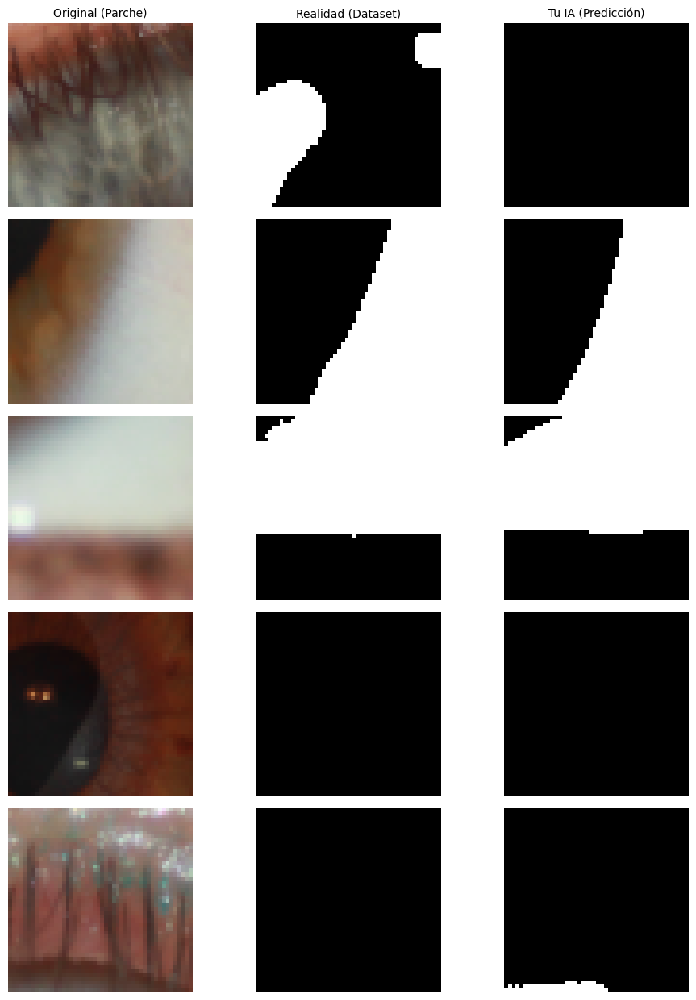

In [24]:
import matplotlib.pyplot as plt
import numpy as np
import random
from tensorflow.keras.models import load_model

# 1. Cargar tu NUEVO modelo de esclera
print("Cargando modelo entrenado con SBVPI...")
model = load_model('/content/gdrive/MyDrive/VesselNet/unet_esclera_sbvpi.h5')

# 2. Elegir muestras al azar de tus datos de validación (ESCLERA)
num_samples = 5
indices = random.sample(range(len(X_val)), num_samples)

sample_images = X_val[indices]
sample_masks  = Y_val[indices]

# 3. Predecir
print(f"La IA está analizando {num_samples} parches de esclera...")
predictions = model.predict(sample_images, verbose=0)
predictions_bin = (predictions > 0.5).astype(np.float32)

# 4. Visualizar
print("\n--- RESULTADOS SEGMENTACIÓN DE ESCLERA (ROI) ---")
plt.figure(figsize=(10, num_samples * 2.5))

for i in range(num_samples):
    # Original
    plt.subplot(num_samples, 3, i*3 + 1)
    plt.imshow(sample_images[i])
    if i==0: plt.title("Original (Parche)", fontsize=10)
    plt.axis('off')

    # Ground Truth (Lo que pintaron los expertos del dataset)
    plt.subplot(num_samples, 3, i*3 + 2)
    plt.imshow(sample_masks[i].reshape(48, 48), cmap='gray')
    if i==0: plt.title("Realidad (Dataset)", fontsize=10)
    plt.axis('off')

    # Predicción (Tu IA)
    plt.subplot(num_samples, 3, i*3 + 3)
    plt.imshow(predictions_bin[i].reshape(48, 48), cmap='gray')
    if i==0: plt.title("Tu IA (Predicción)", fontsize=10)
    plt.axis('off')

plt.tight_layout()
plt.show()

Cargando modelo de esclera...


Analizando: 2R_l_2.png


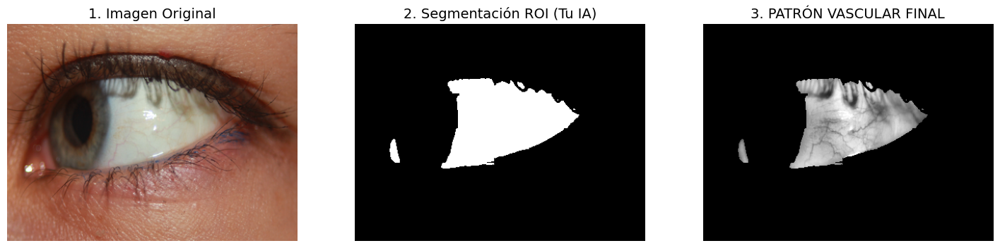

✅ ¡Proceso completado! La imagen 3 es la que usarías para verificar identidad.


In [26]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
import glob
import os
from tensorflow.keras.models import load_model

# --- 1. PREPARAR EL CEREBRO ---
print("Cargando modelo de esclera...")
# Aseguramos que cargamos el modelo de esclera
model = load_model('/content/gdrive/MyDrive/VesselNet/unet_esclera_sbvpi.h5')

# --- 2. FUNCIÓN DE RECONSTRUCCIÓN (Misma lógica, adaptada a Esclera) ---
def get_sclera_and_vessels(image_path, model, patch_size=48):
    # A. Leer Imagen
    img = cv2.imread(image_path)
    if img is None: return None, None, None
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    h, w, _ = img_rgb.shape

    # B. Padding
    pad_h = (patch_size - h % patch_size) % patch_size
    pad_w = (patch_size - w % patch_size) % patch_size
    img_padded = cv2.copyMakeBorder(img_rgb, 0, pad_h, 0, pad_w, cv2.BORDER_CONSTANT, value=0)
    h_pad, w_pad, _ = img_padded.shape

    # C. Escaneo por Parches para encontrar la MÁSCARA (ROI)
    patches_list = []
    coords_list = []

    for y in range(0, h_pad, patch_size):
        for x in range(0, w_pad, patch_size):
            patch = img_padded[y:y+patch_size, x:x+patch_size]
            # Normalizamos (0-1) igual que en el entrenamiento
            patch_norm = patch / 255.0
            patches_list.append(patch_norm)
            coords_list.append((y, x))

    patches_array = np.array(patches_list)

    # Predicción masiva
    predictions = model.predict(patches_array, verbose=0)

    # Reconstruir la máscara gigante
    full_mask = np.zeros((h_pad, w_pad), dtype=np.float32)
    for i, (py, px) in enumerate(coords_list):
        full_mask[py:py+patch_size, px:px+patch_size] = predictions[i].reshape(patch_size, patch_size)

    full_mask = full_mask[:h, :w]
    # Binarizamos la máscara (0 o 1)
    sclera_mask = (full_mask > 0.5).astype(np.uint8)

    # --- D. LA MAGIA DE TU TESIS (Extraer Venas) ---
    # 1. Aplicar CLAHE al canal verde (donde mejor se ven las venas)
    g_channel = img_rgb[:,:,1]
    clahe = cv2.createCLAHE(clipLimit=4.0, tileGridSize=(8,8))
    enhanced = clahe.apply(g_channel)

    # 2. Multiplicar por la máscara (Borrar todo lo que NO sea esclera)
    sclera_vessels = cv2.bitwise_and(enhanced, enhanced, mask=sclera_mask)

    return img_rgb, sclera_mask, sclera_vessels

# --- 3. EJECUCIÓN VISUAL ---

# Buscamos imágenes en tu carpeta de esclera
search_path = '/content/gdrive/MyDrive/VesselNet/dataset_esclera/train/origin/'

# CORRECCIÓN AQUÍ: Usamos glob.glob en ambos lados
all_images = glob.glob(search_path + "*.png") + glob.glob(search_path + "*.jpg")

if len(all_images) > 0:
    # Elegimos una al azar
    test_img = random.choice(all_images)
    print(f"Analizando: {os.path.basename(test_img)}")

    original, mask, vessels = get_sclera_and_vessels(test_img, model)

    # Visualización
    if original is not None:
        plt.figure(figsize=(18, 6))

        plt.subplot(1, 3, 1)
        plt.imshow(original)
        plt.title("1. Imagen Original", fontsize=14)
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(mask, cmap='gray')
        plt.title("2. Segmentación ROI (Tu IA)", fontsize=14)
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(vessels, cmap='gray')
        plt.title("3. PATRÓN VASCULAR FINAL", fontsize=14)
        plt.axis('off')

        plt.show()
        print("✅ ¡Proceso completado! La imagen 3 es la que usarías para verificar identidad.")
    else:
        print("❌ Error al leer la imagen seleccionada.")

else:
    print(f"❌ No encontré imágenes en: {search_path}")

📸 Generando galería con 5 muestras nuevas...



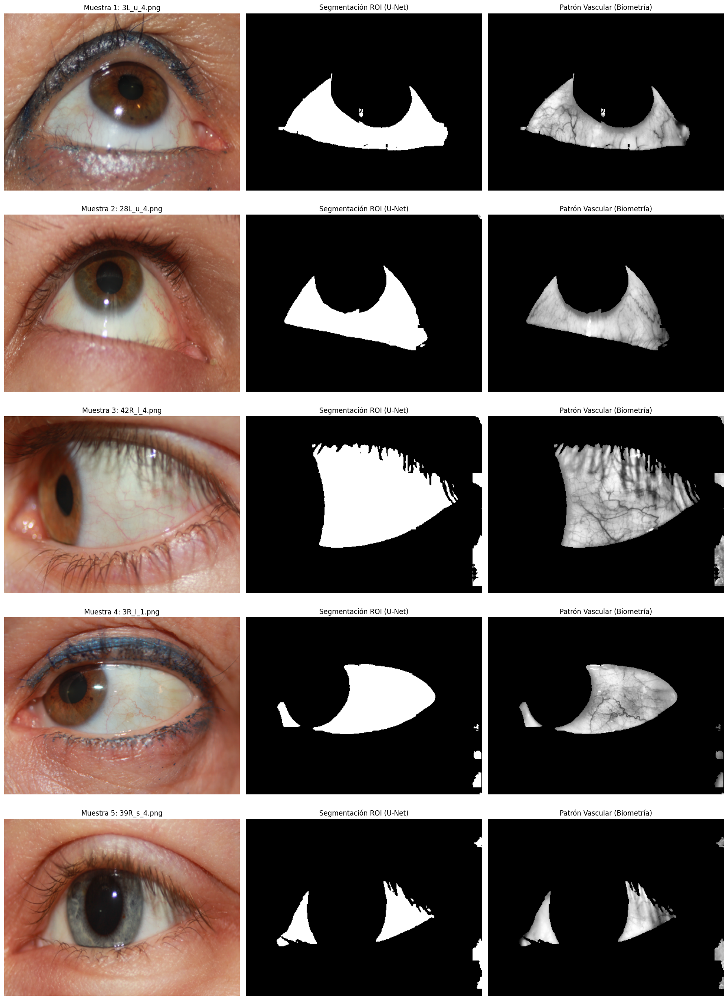

In [27]:
import matplotlib.pyplot as plt
import random
import os

# --- CONFIGURACIÓN ---
num_samples = 5  # ¿Cuántos ojos quieres procesar?

# Verificamos que tengamos suficientes imágenes
if len(all_images) < num_samples:
    num_samples = len(all_images)

# Elegimos 'num_samples' imágenes al azar SIN repetir
selected_images = random.sample(all_images, num_samples)

print(f"📸 Generando galería con {num_samples} muestras nuevas...\n")

# Configuramos el tamaño de la figura (Alto dinámico según cuántas fotos sean)
plt.figure(figsize=(18, 5 * num_samples))

for i, img_path in enumerate(selected_images):
    filename = os.path.basename(img_path)

    # Llamamos a tu función mágica
    original, mask, vessels = get_sclera_and_vessels(img_path, model)

    if original is not None:
        # Fila i, Columna 1: Original
        plt.subplot(num_samples, 3, i*3 + 1)
        plt.imshow(original)
        plt.title(f"Muestra {i+1}: {filename}", fontsize=12)
        plt.axis('off')

        # Fila i, Columna 2: Máscara (U-Net)
        plt.subplot(num_samples, 3, i*3 + 2)
        plt.imshow(mask, cmap='gray')
        plt.title("Segmentación ROI (U-Net)", fontsize=12)
        plt.axis('off')

        # Fila i, Columna 3: Resultado Final
        plt.subplot(num_samples, 3, i*3 + 3)
        plt.imshow(vessels, cmap='gray')
        plt.title("Patrón Vascular (Biometría)", fontsize=12)
        plt.axis('off')
    else:
        print(f"Error leyendo {filename}")

plt.tight_layout()
plt.show()

🔥 Generando Mega-Galería con 10 ojos...
Esto puede tardar unos segundos en renderizar...

💾 ¡Imagen guardada exitosamente en: /content/gdrive/MyDrive/VesselNet/RESULTADOS_FINALES_ESCLERA.png!


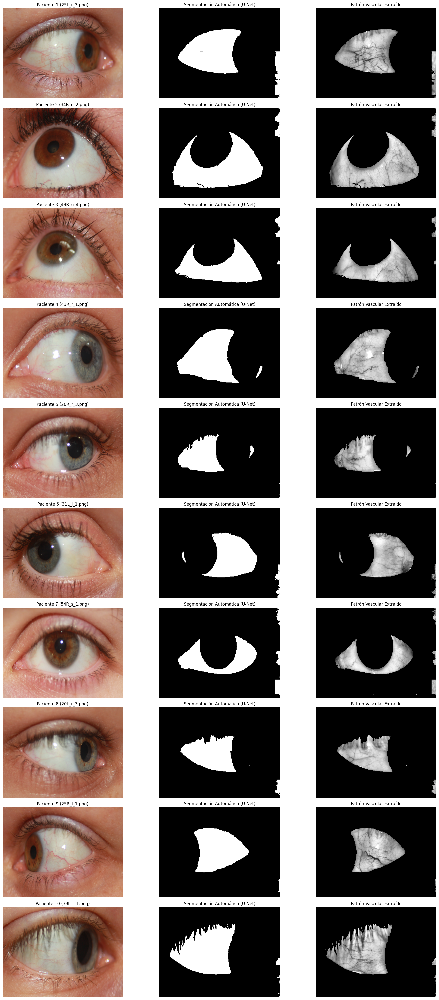

In [28]:
import matplotlib.pyplot as plt
import random
import os
import glob

# --- CONFIGURACIÓN ---
NUM_MUESTRAS = 10  # ¡Vamos a ver 10 ojos distintos!
GUARDAR_EN_DRIVE = True
RUTA_SALIDA = '/content/gdrive/MyDrive/VesselNet/RESULTADOS_FINALES_ESCLERA.png'

# 1. Volvemos a buscar todas las imágenes disponibles
search_path = '/content/gdrive/MyDrive/VesselNet/dataset_esclera/train/origin/'
all_images = glob.glob(search_path + "*.png") + glob.glob(search_path + "*.jpg")

# 2. Selección aleatoria segura
if len(all_images) < NUM_MUESTRAS:
    NUM_MUESTRAS = len(all_images)

selected_images = random.sample(all_images, NUM_MUESTRAS)

print(f"🔥 Generando Mega-Galería con {NUM_MUESTRAS} ojos...")
print("Esto puede tardar unos segundos en renderizar...")

# 3. Configuración de la Figura Gigante
# Aumentamos la altura dinámicamente (4 pulgadas por cada fila)
plt.figure(figsize=(20, 4 * NUM_MUESTRAS))

for i, img_path in enumerate(selected_images):
    filename = os.path.basename(img_path)

    # Procesamiento (Tu algoritmo)
    original, mask, vessels = get_sclera_and_vessels(img_path, model)

    if original is not None:
        # Columna 1: Original
        plt.subplot(NUM_MUESTRAS, 3, i*3 + 1)
        plt.imshow(original)
        plt.title(f"Paciente {i+1} ({filename})", fontsize=12)
        plt.axis('off')

        # Columna 2: Tu IA (ROI)
        plt.subplot(NUM_MUESTRAS, 3, i*3 + 2)
        plt.imshow(mask, cmap='gray')
        plt.title("Segmentación Automática (U-Net)", fontsize=12)
        plt.axis('off')

        # Columna 3: Resultado Biométrico
        plt.subplot(NUM_MUESTRAS, 3, i*3 + 3)
        plt.imshow(vessels, cmap='gray')
        plt.title("Patrón Vascular Extraído", fontsize=12)
        plt.axis('off')

plt.tight_layout()

# 4. Guardar en Drive antes de mostrar
if GUARDAR_EN_DRIVE:
    plt.savefig(RUTA_SALIDA, dpi=150, bbox_inches='tight')
    print(f"\n💾 ¡Imagen guardada exitosamente en: {RUTA_SALIDA}!")

plt.show()